# COMMUNITY DETECTION ON THE COUNTRY GRAPH

## CREATING THE GRAPH
- We're using the country-only graph for this task.

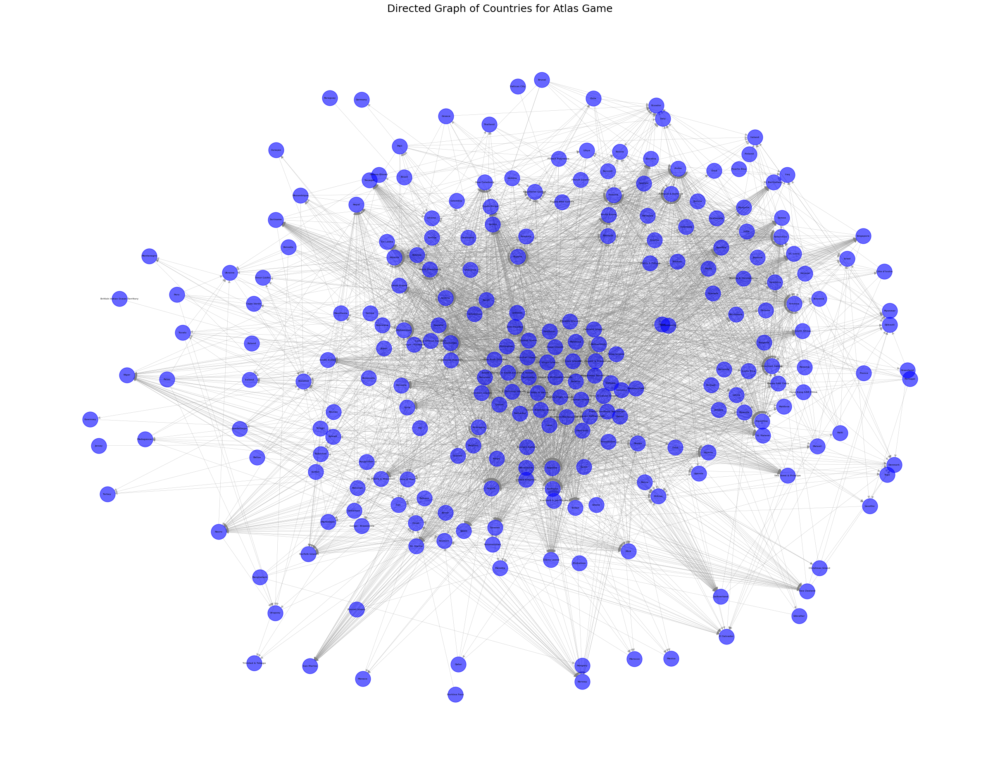

Number of nodes: 249
Number of edges: 3566


In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import random
from networkx.algorithms import community

file_path = "./data/country.csv"  # Replace with your CSV path
df = pd.read_csv(file_path)

countries = df.set_index('value')['id'].to_dict()

G = nx.DiGraph()
for country, code in countries.items():
    last_letter = country[-1].lower()
    for other_country, other_code in countries.items():
        if other_country[0].lower() == last_letter and country != other_country:
            G.add_edge(country, other_country)

# Optional: visualize the directed graph
plt.figure(figsize=(24, 18))
pos = nx.fruchterman_reingold_layout(G, k=0.9, seed=42)
nx.draw(
    G, pos, with_labels=True, 
    node_size=700, node_color='blue', 
    edge_color='gray', font_size=4, 
    font_weight='bold', width=0.3, alpha=0.6
)
plt.title("Directed Graph of Countries for Atlas Game", fontsize=18)
plt.show()

print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")


## LOUVAIN COMMUNITY DETECTION
- Louvain's algorithm is a hierarchical, greedy optimization method for detecting high-modularity communities in large graphs.
- Louvain's Two-Step Approach
    - 1️⃣ Phase 1: Local Optimization of Modularity
        - Each node is assigned to its own community.
        - Nodes are moved to neighboring communities if this increases modularity.
        - This step is repeated until no improvement in modularity is possible.
    - 2️⃣ Phase 2: Community Aggregation

        - Communities are collapsed into "supernodes".
        - A new graph is built where supernodes become the new nodes.
        - The algorithm repeats Phase 1 on this reduced graph.
    - This process continues until no more modularity gain is possible.

In [8]:
import networkx as nx
import matplotlib.pyplot as plt
import community.community_louvain as community_louvain  # Louvain method for community detection

# Convert directed graph to undirected for Louvain
G_undirected = G.to_undirected()

# Apply Louvain community detection
partition = community_louvain.best_partition(G_undirected)

# Extract communities
communities = {}
for node, comm in partition.items():
    if comm not in communities:
        communities[comm] = []
    communities[comm].append(node)

# Print community summary
print(f"\n🔹 Detected {len(communities)} communities using Louvain Algorithm:")
for comm_id, members in communities.items():
    print(f"Community {comm_id}: {', '.join(members[:])}")  # Show only 10 members for brevity

# Compute modularity score
modularity_score = community_louvain.modularity(partition, G_undirected)
print(f"\n🔹 Modularity Score: {modularity_score:.4f}")




🔹 Detected 5 communities using Louvain Algorithm:
Community 0: Afghanistan, Albania, Algeria, American Samoa, Andorra, Angola, Anguilla, Antarctica, Antigua & Barbuda, Argentina, Armenia, Aruba, Australia, Austria, Azerbaijan, Hong Kong SAR China, Macao SAR China, Malaysia, Malta, Mauritania, Micronesia, Moldova, Mongolia, Bermuda, Bolivia, Bosnia & Herzegovina, Botswana, Latvia, Liberia, Libya, Lithuania, India, Indonesia, Bulgaria, Cambodia, Canada, China, Colombia, Congo - Kinshasa, Costa Rica, Croatia, Cuba, Czechia, Kenya, Romania, Russia, Rwanda, Tanzania, Tonga, Tunisia, French Guiana, French Polynesia, Gambia, Georgia, Ghana, Gibraltar, Grenada, Guatemala, Guinea, Uganda, Guyana, Qatar, Jamaica, Panama, Papua New Guinea, Venezuela, Wallis & Futuna, Western Sahara, Zambia
Community 1: Namibia, Nauru, Nepal, Netherlands, New Caledonia, New Zealand, Nicaragua, Niger, Nigeria, Niue, Norfolk Island, North Korea, North Macedonia, Northern Mariana Islands, Norway, Bahrain, Benin, Bhu

### VISUALIZING THE COMMUNITIES
- Kept it simple, just coloured the nodes belonging to different communities different colours.

/tmp/ipykernel_3739/480083722.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap("tab10", num_communities)  # Generate distinct colors


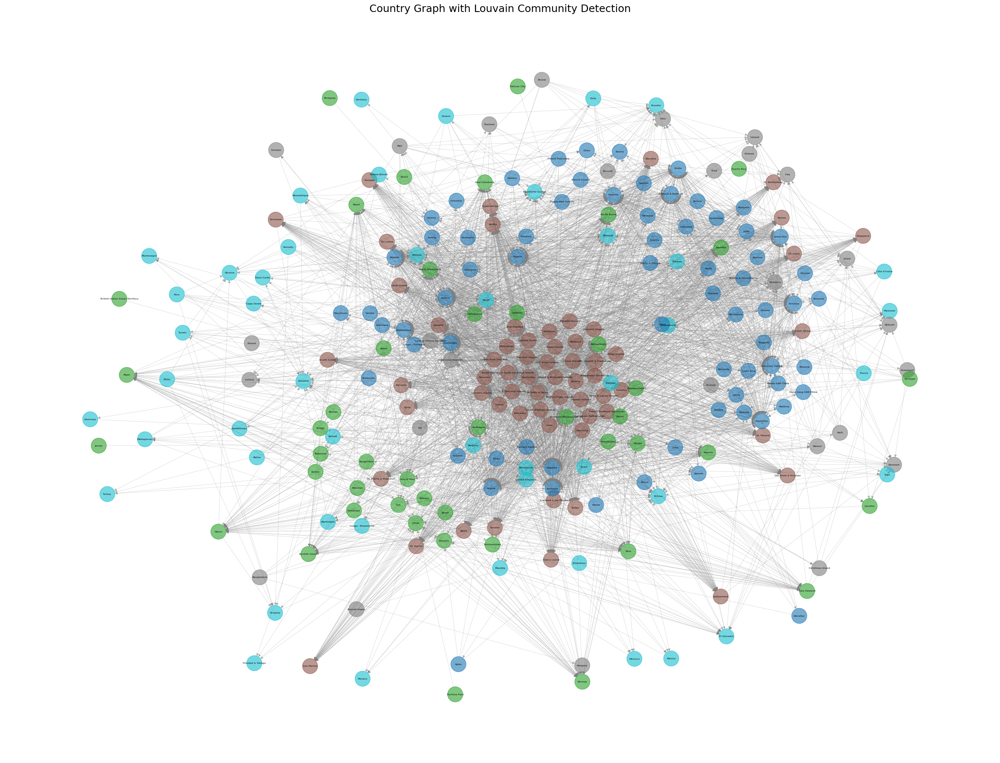

✅ Number of nodes: 249
✅ Number of edges: 3566
✅ Number of detected communities: 5


In [9]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import random
import community  # Louvain community detection

# Load country data
file_path = "./data/country.csv"  # Replace with your CSV path
df = pd.read_csv(file_path)

# Extract country names
countries = df.set_index('value')['id'].to_dict()

# Create directed graph
G = nx.DiGraph()
for country, code in countries.items():
    last_letter = country[-1].lower()
    for other_country, other_code in countries.items():
        if other_country[0].lower() == last_letter and country != other_country:
            G.add_edge(country, other_country)

# Run Louvain's community detection
# partition = community.best_partition(G.to_undirected())  # Convert to undirected graph for community detection

# Assign colors based on community detection
num_communities = len(set(partition.values()))
color_map = plt.cm.get_cmap("tab10", num_communities)  # Generate distinct colors

node_colors = [color_map(partition[node]) for node in G.nodes()]

# Plot the graph with community colors
plt.figure(figsize=(24, 18))
pos = nx.fruchterman_reingold_layout(G, k=0.9, seed=42)  # Same layout as before
nx.draw(
    G, pos, with_labels=True, node_size=700, 
    node_color=node_colors, edge_color='gray', 
    font_size=4, font_weight='bold', width=0.3, alpha=0.6
)

plt.title("Country Graph with Louvain Community Detection", fontsize=18)
plt.show()

print(f"✅ Number of nodes: {G.number_of_nodes()}")
print(f"✅ Number of edges: {G.number_of_edges()}")
print(f"✅ Number of detected communities: {num_communities}")

### WE CAN DO BETTER
- Force-generated layout.
- I sure do hope my resultant graph doesn't try to summon the demons of the underworld or anything!

/tmp/ipykernel_3739/3892468629.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap("tab10", num_communities)


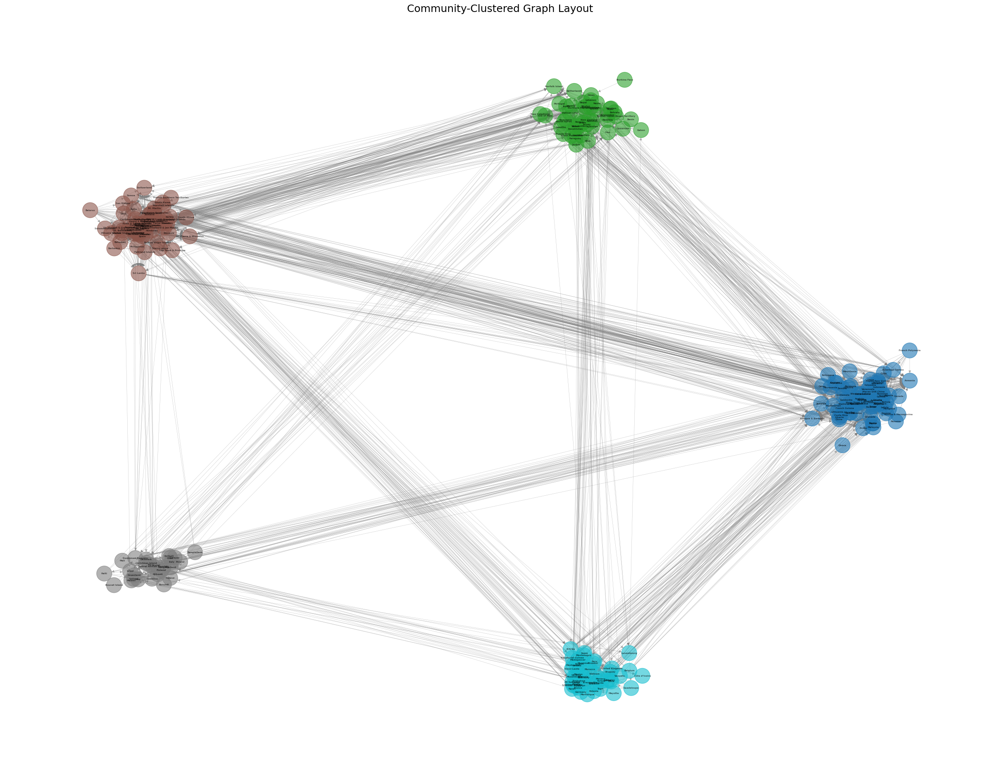

Number of nodes: 249
Number of edges: 3566
Number of detected communities: 5


In [10]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import community
import numpy as np

# Load country data
file_path = "./data/country.csv"  # Replace with your CSV path
df = pd.read_csv(file_path)

# Extract country names
countries = df.set_index('value')['id'].to_dict()

# Create directed graph
G = nx.DiGraph()
for country, code in countries.items():
    last_letter = country[-1].lower()
    for other_country, other_code in countries.items():
        if other_country[0].lower() == last_letter and country != other_country:
            G.add_edge(country, other_country)

# Run Louvain community detection
# we already ran partition above in the first cell so im not running it again and again
# partition = community.best_partition(G.to_undirected())

# Assign colors to each community
num_communities = len(set(partition.values()))
color_map = plt.cm.get_cmap("tab10", num_communities)
node_colors = [color_map(partition[node]) for node in G.nodes()]

# Generate a clustered layout
def community_layout(graph, partition, scale=5):
    """
    Generates a force-directed layout where nodes in the same community are grouped together.

    Parameters:
    - graph: NetworkX graph
    - partition: Dictionary mapping nodes to community IDs
    - scale: Spread of clusters in the layout

    Returns:
    - pos: Dictionary mapping nodes to positions
    """
    pos_communities = {}  # Position of each community
    pos_nodes = {}  # Position of each node

    # Assign random circular positions to communities
    for community_id in set(partition.values()):
        pos_communities[community_id] = np.array([
            np.cos(2 * np.pi * community_id / num_communities) * scale, 
            np.sin(2 * np.pi * community_id / num_communities) * scale
        ])

    # Spread out nodes within their community cluster
    for node, comm in partition.items():
        # Start with spring layout to position nodes
        pos_nodes[node] = pos_communities[comm] + np.random.randn(2) * 0.5  # Add small random perturbation

    return pos_nodes

# Get community-aware layout
pos = community_layout(G, partition, scale=10)

# Plot the graph with community clustering
plt.figure(figsize=(24, 18))
nx.draw(
    G, pos, with_labels=True, node_size=700,
    node_color=node_colors, edge_color='gray',
    font_size=4, font_weight='bold', width=0.3, alpha=0.6
)

plt.title("Community-Clustered Graph Layout", fontsize=18)
plt.show()

print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")
print(f"Number of detected communities: {num_communities}")


- So my resultant graph tried to summon demons from the underworld but who can blame him he was born today :(

/tmp/ipykernel_3739/4236255434.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=community_sizes.index, y=community_sizes.values, palette="viridis")


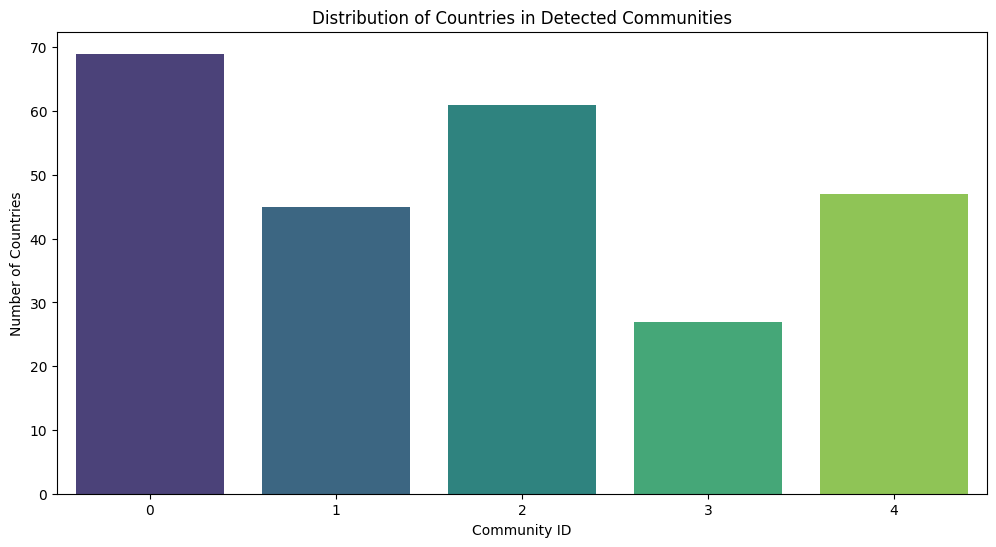

In [11]:
import seaborn as sns
import pandas as pd

# Convert community partitioning to a DataFrame
community_df = pd.DataFrame(list(partition.items()), columns=["Country", "Community"])

# Count the number of countries in each community
community_sizes = community_df["Community"].value_counts().sort_values(ascending=False)

# Plot community sizes
plt.figure(figsize=(12, 6))
sns.barplot(x=community_sizes.index, y=community_sizes.values, palette="viridis")
plt.xlabel("Community ID")
plt.ylabel("Number of Countries")
plt.title("Distribution of Countries in Detected Communities")
plt.show()


### ABOUT THE COMMUNITIES
- Do the communities detected actually mean something to us in the context of the Atlas game, or in any meaningful way to real life?
- Upon closer observation, it actually does!
- There are five distinct communities we see:
    - **A Grade**: the vast majority of the countries beginning/ending with an A
    - **Beginning of the N**: most of the countries here start or end with an N
    - **S for Slay**: countries starting or ending with an S
    - **Can I see some ID?**: countries beginning or ending with both I and D
    - **All about ME**: countries beginning or ending with M and E, also a little bit of T

## LEIDEN COMMUNITY DETECTION
- Improved Louvain.
- Fixes some of Louvain's shortcomings, specifically the case where some of the communities found by Louvain are not well-connected. This is achieved by periodically randomly breaking down communities into smaller well-connected ones.

Number of detected communities (Leiden): 4
Leiden Modularity: 0.4683


/tmp/ipykernel_3739/2101184255.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap("tab10", num_communities_leiden)


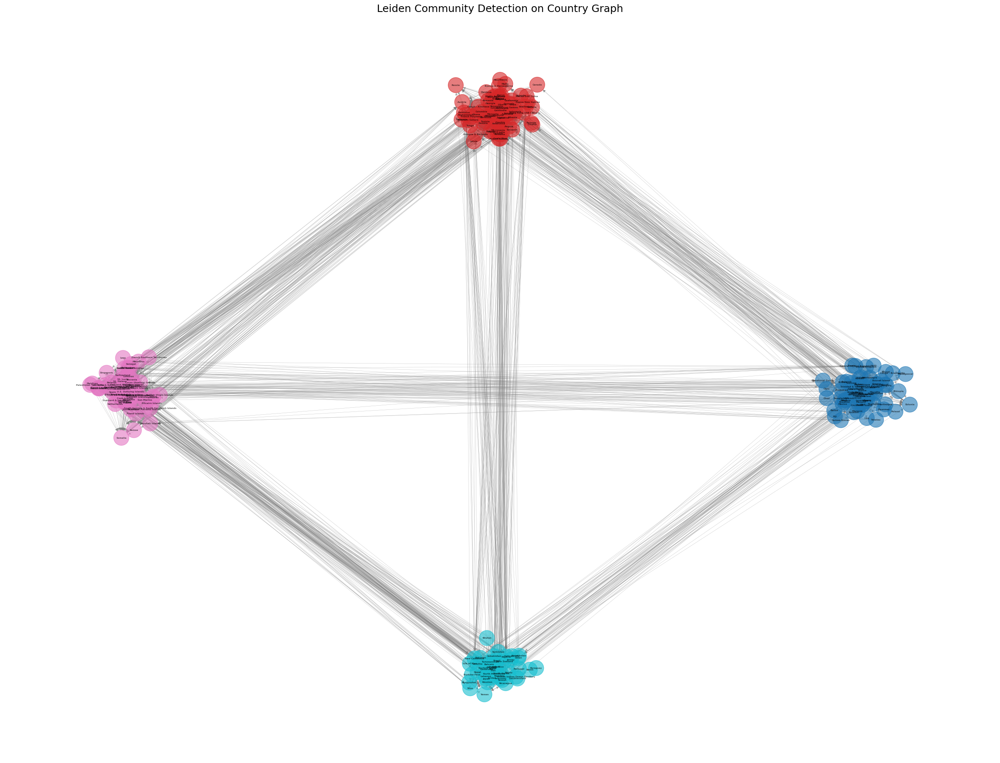

In [33]:
import pandas as pd
import networkx as nx
import igraph as ig
import leidenalg
import matplotlib.pyplot as plt

# Convert NetworkX graph to an iGraph object (Leiden works on iGraph)
G_igraph = ig.Graph.TupleList(G.edges(), directed=True)

# Run Leiden community detection
leiden_partition = leidenalg.find_partition(G_igraph, leidenalg.ModularityVertexPartition)

# Convert Leiden community result into a dictionary format
partition_leiden = {G_igraph.vs[idx]["name"]: comm_id for idx, comm_id in enumerate(leiden_partition.membership)}

# Get number of communities
num_communities_leiden = len(set(partition_leiden.values()))
print(f"Number of detected communities (Leiden): {num_communities_leiden}")

# Modularity score for Leiden
modularity_leiden = leiden_partition.quality()
print(f"Leiden Modularity: {modularity_leiden:.4f}")

# Assign colors to communities
color_map = plt.cm.get_cmap("tab10", num_communities_leiden)
node_colors = [color_map(partition_leiden[node]) for node in G.nodes()]

# Generate a clustered layout
def community_layout(graph, partition, scale=5):
    pos_communities = {}  # Position of each community
    pos_nodes = {}  # Position of each node

    # Assign random circular positions to communities
    for community_id in set(partition.values()):
        pos_communities[community_id] = np.array([
            np.cos(2 * np.pi * community_id / num_communities_leiden) * scale, 
            np.sin(2 * np.pi * community_id / num_communities_leiden) * scale
        ])

    # Spread out nodes within their community cluster
    for node, comm in partition.items():
        pos_nodes[node] = pos_communities[comm] + np.random.randn(2) * 0.5  # Add small random perturbation

    return pos_nodes

# Get community-aware layout
pos_leiden = community_layout(G, partition_leiden, scale=10)

# Plot the Leiden-based graph
plt.figure(figsize=(24, 18))
nx.draw(
    G, pos_leiden, with_labels=True, node_size=700,
    node_color=node_colors, edge_color='gray',
    font_size=4, font_weight='bold', width=0.3, alpha=0.6
)

plt.title("Leiden Community Detection on Country Graph", fontsize=18)
plt.show()

## SPECTRAL CLUSTERING

/home/i-am-space/IIIT/ATLAS/.venv/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)
/tmp/ipykernel_3739/3856244770.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap("tab10", num_communities_spectral)


Number of detected communities (Spectral Clustering): 5


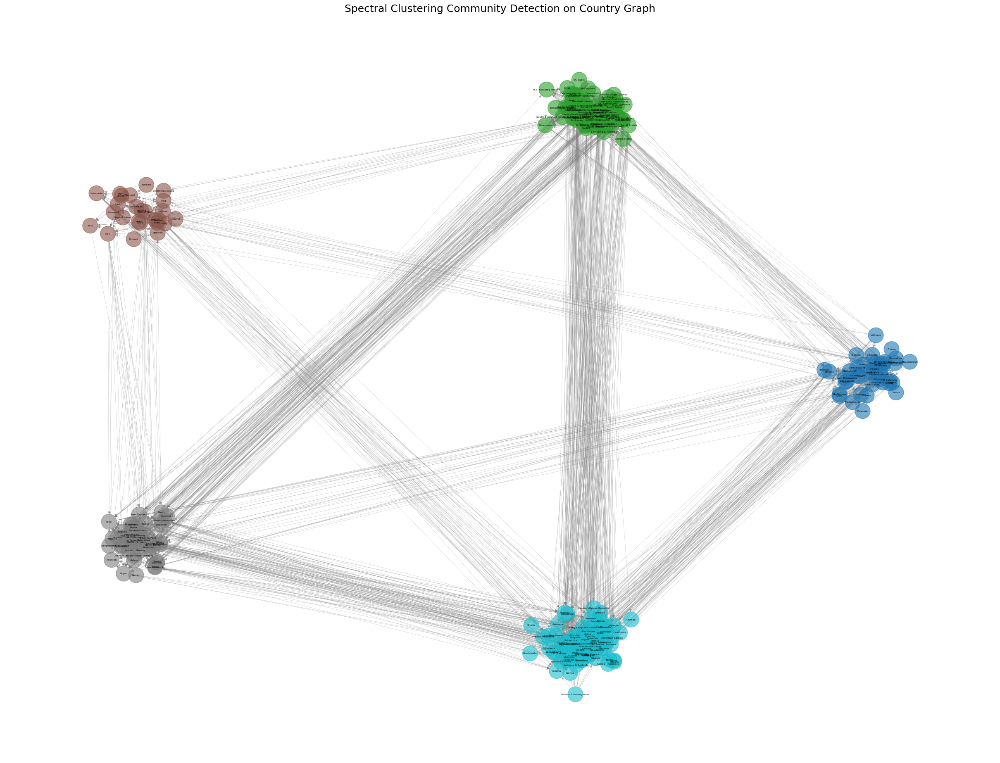

In [28]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering


# Convert Graph to Adjacency Matrix
adj_matrix = nx.to_numpy_array(G)

# Choose the number of communities (can be auto-tuned later)
num_clusters = 5  # Adjust this number based on modularity tuning

# Apply Spectral Clustering
spectral = SpectralClustering(n_clusters=num_clusters, affinity="precomputed", assign_labels="kmeans", random_state=42)
labels = spectral.fit_predict(adj_matrix)

# Convert clustering results into a dictionary
partition_spectral = {node: labels[i] for i, node in enumerate(G.nodes())}

# Get number of communities detected
num_communities_spectral = len(set(labels))
print(f"Number of detected communities (Spectral Clustering): {num_communities_spectral}")

# Assign colors to communities
color_map = plt.cm.get_cmap("tab10", num_communities_spectral)
node_colors = [color_map(partition_spectral[node]) for node in G.nodes()]

# Generate a clustered layout
def community_layout(graph, partition, scale=5):
    pos_communities = {}
    pos_nodes = {}

    for community_id in set(partition.values()):
        pos_communities[community_id] = np.array([
            np.cos(2 * np.pi * community_id / num_communities_spectral) * scale, 
            np.sin(2 * np.pi * community_id / num_communities_spectral) * scale
        ])

    for node, comm in partition.items():
        pos_nodes[node] = pos_communities[comm] + np.random.randn(2) * 0.5

    return pos_nodes

# Get community-aware layout
pos_spectral = community_layout(G, partition_spectral, scale=10)

# Plot the Spectral Clustering-based graph
plt.figure(figsize=(24, 18))
nx.draw(
    G, pos_spectral, with_labels=True, node_size=700,
    node_color=node_colors, edge_color='gray',
    font_size=4, font_weight='bold', width=0.3, alpha=0.6
)

plt.title("Spectral Clustering Community Detection on Country Graph", fontsize=18)
plt.show()


## WHAT DOES THIS MEAN FOR US?
- Almost every one of our community detection algorithms seem to agree on the SAME five-community split (our spectral clustering implementation took a little convincing but got there eventually). Leiden, however seemed to be quite stubborn on 4, but with a higher modularity.
- This makes sense intuitively, as nodes (countries) that share common transitions form strongly connected components (SCCs), naturally grouping them.
- **Why is this interesting?** In our game simulations on the various graphs, the smart moves using SCCs to make decisions are consistently among the most successful (most games won out of 100 against a random player).
- **ACTIONABLE INSIGHTS**
    - 1️⃣ Early Game: Stay Inside Large Communities
        - Stick to "A Grade" and "S for Slay", as they have the highest number of moves.
        - Avoid using bridge countries too early.
    - 2️⃣ Mid Game: Control Bridge Countries
        - Identify transition points between communities and use them only when necessary.
        - Force the opponent to burn their transitions first.
    - 3️⃣ Endgame: Trap the Opponent in a Small Community
        - If an opponent moves into "All About ME" or "Can I See Some ID?", block their exit.
        - This forces them into a dead-end, resulting in a loss.
    - 4️⃣ Dynamic Play Based on Letter Frequency
        - If a letter has many options, it is safe.
        - If a letter has few options, use it to trap the opponent.


## LEIDEN-BASED STRATEGY


In [48]:
# Smart Player Strategy: Prioritizes controlling bridges and forcing the opponent into weak zones
def smart_community_move_v2(graph, current_city, visited):
    if current_city not in partition_leiden:
        return None  # If the city is not in the partition, return None

    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    current_community = partition_leiden[current_city]

    # Step 1: Stay within the same community if possible
    same_community_moves = [s for s in successors if partition_leiden.get(s, -1) == current_community]
    if same_community_moves:
        return max(same_community_moves, key=lambda x: len(list(graph.successors(x))), default=None)  # Prefer nodes with more options

    # Step 2: If forced out, choose a move that limits opponent options
    opponent_weak_moves = sorted(successors, key=lambda x: len(list(graph.successors(x))), reverse=False)  # Choose move with least successor options for the opponent
    return opponent_weak_moves[0]  # Force the opponent into the weakest position


# Random Player Strategy: Chooses any available move randomly
def random_player_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves
    return random.choice(successors)

# Function to simulate a single game
def simulate_game(graph, start_city, smart_player_move, dumb_player_move, max_moves=50, visualize=False):
    current_graph = graph.copy()
    visited = set()
    current_city = start_city
    turn = 0  # 0 = Smart Player, 1 = Random Player

    if visualize:
        print(f"\n🔹 Starting city: {start_city}")

    for move in range(1, max_moves + 1):
        # Determine current player
        if turn == 0:
            next_city = smart_player_move(current_graph, current_city, visited)
        else:
            next_city = dumb_player_move(current_graph, current_city, visited)

        if next_city is None:  # If a player has no valid moves, they lose
            return turn  # Return the player number (0 = Smart, 1 = Random) who lost

        # Remove current city from graph
        visited.add(current_city)
        current_graph.remove_node(current_city)
        current_city = next_city

        # Switch turns
        turn = 1 - turn  # Alternate between 0 and 1

        if visualize:
            print(f"Move {move}: {'Smart' if turn == 1 else 'Random'} → {current_city}")

    return None  # If the game reaches max moves, it's a draw


In [51]:
# Run multiple simulations comparing Community-Aware Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G.nodes), num_simulations):
    result = simulate_game(G, start_city, smart_community_move_v2, random_player_move, max_moves=50)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Community-Aware Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")


Smart Community-Aware Player Wins: 64 (64.00%)
Random Player Wins: 36 (36.00%)
Draws: 0 (0.00%)


- As we can see we have a bit of a competitive advantage here using the Leiden community detection